In [1]:
import os

import matplotlib.pyplot as plt
import h5py as h5
import torch

from torch import nn
from astropy.io import fits
from collections import OrderedDict

In [2]:
path_to_data = '/Volumes/T7/ay_98_data/Zou_data'

In [6]:
xmmlss_photo = fits.open(os.path.join(path_to_data, 'photometry/xmmlss_photcat.v1.fits'))
wcdfs_photo = fits.open(os.path.join(path_to_data, 'photometry/wcdfs_photcat.v1.fits'))
es1_photo = fits.open(os.path.join(path_to_data, 'photometry/es1_photcat.v1.fits'))

In [8]:
es1_photo.info()

Filename: /Volumes/T7/ay_98_data/Zou_data/photometry/es1_photcat.v1.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU    166   826242R x 79C   [25A, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D]   


In [10]:
es1_photo[1].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                  649 / length of dimension 1                          
NAXIS2  =               826242 / length of dimension 2                          
PCOUNT  =                    0 / number of group parameters                     
GCOUNT  =                    1 / number of groups                               
TFIELDS =                   79 / number of table fields                         
TTYPE1  = 'Tractor_ID'                                                          
TFORM1  = '25A     '                                                            
TTYPE2  = 'f_X_int '                                                            
TFORM2  = 'D       '                                                            
TTYPE3  = 'ferr_X_int'      

In [35]:
print(es1_photo[1].data[0]['f_MIPS70'])

10.576706605690115


In [36]:
print(es1_photo[1].data['Tractor_ID'].shape, es1_photo[1].data['f_MIPS24'].shape)
es1_photo[1].data['f_MIPS24']

(826242,) (826242,)


array([0.26863285, 0.01585104, 0.44959473, ..., 0.25666812, 0.00686742,
       0.28348123], dtype='>f8')

In [37]:
model = nn.Sequential(OrderedDict([
    ('dense1', nn.Linear(1, 1)),
    ('act1', nn.Sigmoid()),
    ('dense2', nn.Linear(1, 1)),
    ('act2', nn.ReLU()),
    ('output', nn.Linear(1, 1)),
    ('outact', nn.Sigmoid()),
]))

In [38]:
print(model.parameters())

<generator object Module.parameters at 0x165db5e00>


In [39]:
class NN():
    def __init__(self, num_inputs, num_ouputs, nodes_per_layer: list):
        self.model = nn.Sequential()
        self.nlayers = len(nodes_per_layer)
        self.num_inputs = num_inputs
        self.num_outputs = num_ouputs
        self.loss_fn = nn.MSELoss()
        self.optimizer = torch.optim.Adam(self.model.parameters())

        model.add_module('input', nn.Linear(self.num_inputs, nodes_per_layer[0]))
        for i, nodes in enumerate(nodes_per_layer[:-1]):
            print(nodes, nodes_per_layer[i + 1])
            model.add_module(f'layer{i}', nn.Linear(nodes, nodes_per_layer[i + 1]))
            model.add_module(f'act{i}', nn.Sigmoid())
        model.add_module('output', nn.Linear(nodes_per_layer[-1], self.num_outputs))

    def train(self, num_epochs: int = 500, verbose: bool = False):
        for epoch in num_epochs:
            y_pred = model(Xbatch)
            loss = self.loss_fn(y_pred, ybatch)
            self.optimizer.zero_grad()
            loss.backward()
            self.optimizer.step()
            if verbose: print(f'Finished epoch {epoch}')

    def predict(self, X):
        return model(X)


In [40]:
test = NN(1, 1, [1,2,1])

ValueError: optimizer got an empty parameter list

In [13]:
s1_models = h5.File('/Volumes/T7/ay_98_data/Zou_data/sed_models/es1/models_gal_es1.h5', 'r')

In [14]:
print(s1_models.keys())

<KeysViewHDF5 ['644246429973', '644246429974', '644246429975', '644246429976', '644246429977', '644246429978', '644246429979', '644246429980', '644246429982', '644246429983', '644246429984', '644246429985', '644246429986', '644246429987', '644246429988', '644246429989', '644246429990', '644246429991', '644246429993', '644246429994', '644246429995', '644246429996', '644246429997', '644246429998', '644246429999', '644246430000', '644246430001', '644246430002', '644246430003', '644246430004', '644246430005', '644246430006', '644246430007', '644246430008', '644246430009', '644246430010', '644246430011', '644246430012', '644246430013', '644246430014', '644246430015', '644246430016', '644246430017', '644246430018', '644246430019', '644246430020', '644246430021', '644246430022', '644246430023', '644246430024', '644246430025', '644246430026', '644246430027', '644246430028', '644246430029', '644246430030', '644246430031', '644246430032', '644246430033', '644246430034', '644246430035', '64424643

In [16]:
s1_models['644246429974'].keys()

<KeysViewHDF5 ['L_lambda_total', 'attenuation.nebular.continuum_old', 'attenuation.nebular.continuum_young', 'attenuation.nebular.lines_old', 'attenuation.nebular.lines_young', 'attenuation.stellar.old', 'attenuation.stellar.young', 'dust', 'igm', 'nebular.absorption_old', 'nebular.absorption_young', 'nebular.continuum_old', 'nebular.continuum_young', 'nebular.lines_old', 'nebular.lines_young', 'stellar.old', 'stellar.young', 'wavelength', 'xray.agn', 'xray.galaxy']>

[]

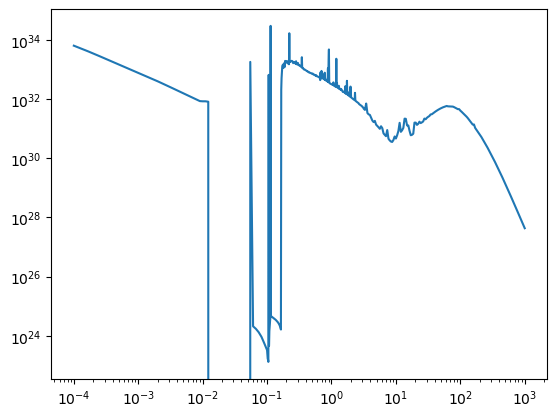

In [15]:
plt.plot(s1_models['644246429974']['wavelength'][...], s1_models['644246429974']['L_lambda_total'][...])
plt.loglog()

In [16]:
es1 = fits.open(os.path.join(path_to_data, 'sed_catalog/es1.v1.fits'))

In [17]:
es1[1].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                  401 / length of dimension 1                          
NAXIS2  =               826242 / length of dimension 2                          
PCOUNT  =                    0 / number of group parameters                     
GCOUNT  =                    1 / number of groups                               
TFIELDS =                   55 / number of table fields                         
TTYPE1  = 'Tractor_ID'                                                          
TFORM1  = 'K       '                                                            
TTYPE2  = 'RA      '                                                            
TFORM2  = 'D       '                                                            
TTYPE3  = 'DEC     '        

In [3]:
import numpy as np
print(np.all(np.isnan([1, np.NaN])))

False
